In [1]:
# Ignore the warnings
import warnings
# warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Auto reload of library
%reload_ext autoreload
%autoreload 2

# Python path
import sys
base_folder = 'DataScience'
location_base = os.path.join(os.getcwd().split(base_folder)[0], base_folder)
location_module = [os.path.join(location_base, 'Module')] 
for each in location_module:
    if each not in sys.path:
        sys.path.append(each)

from import_KK import *
DeviceStrategy_CPU()
from data_KK import *
from description_KK import *
from preprocessing_KK import *
from preprocessing_text_KK import * ##
from algorithm_textmining_KK import * ##
from evaluation_KK import *
from visualization_KK import *

FONT_NAME = 'malgun'
plt.rc('font', family=FONT_NAME) 
plt.rcParams['font.family'] = FONT_NAME
mpl.rc('font', family=FONT_NAME)
sns.set(font=FONT_NAME) 
sys_font = font_manager.findSystemFonts()
FONT_PATHS = [path for path in sys_font if 'malgun' in path]
if len(FONT_PATHS) != 0:
    rc('font', family=font_manager.FontProperties(fname=FONT_PATHS[0]).get_name())

JAVA is in the system path?:  False
JAVA is in the system path?:  Adding...
Operation Machine:  Intel64 Family 6 Model 186 Stepping 2, GenuineIntel
Operation Platform:  64bit
OS Type:  Windows
OS Version:  11
Python Version:  3.12.3 | packaged by conda-forge | (main, Apr 15 2024, 18:20:11) [MSC v.1938 64 bit (AMD64)]


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\KK\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\KK\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[Kss]: From C:\Users\KK\anaconda3\Lib\site-packages\tf_keras\src\losses.py:2976: The name tf.losses.sparse_softmax_cross_entropy is deprecated. Please use tf.compat.v1.losses.sparse_softmax_cross_entropy instead.



Cuda is Ready?  False

Tensorflow Version:  2.18.0
Keras Version:  3.7.0
Torch Version:  2.5.1+cpu


2025-02-27 02:43:54,575	INFO worker.py:1777 -- Started a local Ray instance. View the dashboard at http://127.0.0.1:8265 
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\KK\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\KK\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
def get_data_from_path(folder_location, folder_name=False, concat_axis='row', 
                       reset_index=False, date_column=None):
    # path_folder 하위의 모든 폴더위치와 내부 file 출력
    df = pd.DataFrame()
    print('Getting data from', len(os.listdir(folder_location)), 'folders...')
    for (path, dir, files) in os.walk(folder_location):
#         print(path)
        for file in tqdm(files):
            path_file = os.path.join(path, file)

            ## 데이터 로딩
            if path_file[-4:] == 'xlsx':
                df_sub = pd.read_excel(path_file)
            elif path_file[-3:] == 'csv':
                df_sub = pd.read_csv(path_file)
                
            ### 왓차피디어 변수명변경
            if 'reviewDate' in df_sub.columns:
                df_sub.rename(columns={'year':'date'}, inplace=True)
            elif 'writer' in df_sub.columns:
                df_sub.rename(columns={'writer':'username', 'comment':'review'}, inplace=True)

            ## 키워드 태깅 여부
            if folder_name:
                df_sub['Folder_Name'] = file 
                df_sub['Opening'] = os.path.basename(path).split('(')[1].split(')')[0]
                           
            ## 결합
            if concat_axis == 'col':
                df = pd.concat([df, df_sub], axis=1)
            elif concat_axis == 'row':
                df = pd.concat([df, df_sub], axis=0)
    
    # 정리
    if reset_index:
        df = df.reset_index().iloc[:,1:]
    if date_column != None:
        df[date_column] = pd.to_datetime(df[date_column])
                
    return df

# Hyperparameters

In [3]:
# 데이터 파라미터
FILTER_MOVIE = ['살인자의 기억법']
SOURCE_NAME = 'df_movie.csv'
LANGUAGE = 'korean'
TARGET = 'Comment'
CATEGORY = 'Viewing'
# 전처리모델 파라미터
STOPWORDS = ['정보 없음', '없음', '정보', '영화', '너무', '정말', 
             '눈물이', '봤어요', '봤습니다', '하는', '하고', '있는', '없다', 
             '보고', '이렇게', '대한', '보는', '그냥']
NGRAM_RANGE = (1,2)
TFIDF_MAXCOL = 10000
TFIDF_DELLOWFREQ = False
RAY = True
KEYBERT_TOPNKWD = 5
WINDOW_SIZE = 1
NUM_SHOWKEYWORD = 200
# 모델링 파라미터
TOKENIZER = 'KeyBERT'
# euclidean, manhattan, chebyshev, minkowski, canberra, braycurtis, mahalanobis, wminkowski, seuclidean, cosine, correlation
# haversine, hamming, jaccard, dice, russelrao, kulsinski, ll_dirichlet, hellinger, rogerstanimoto, sokalmichener, sokalsneath, yule
UMAP_METRIC = 'euclidean'
UMAP_SEED = 123
NUM_TOPICS = 'auto'
NUM_TOPICWORDS = 10
NUM_TOPICSAMPLES = 5
# 저장
SAVE_LOCAL = True
SAVE_NAME_FREQ = 'wordfreq'
SAVE_NAME_LDA = 'Topics_byTokenLDA.xlsx'
SAVE_NAME_BERTopic = 'Topics_byBERTopic.xlsx'

# Data & Preprocessing

In [57]:
# # 데이터
# ## 로딩
# df = get_data_from_path(os.path.join('.', 'Data_Raw'), folder_name=True, concat_axis='row', 
#                         reset_index=True, date_column=None)
# ## 변수명 변환
# df.rename(columns={'Folder_Name':'Movie', 'username':'User', 'date':'Viewing', 'review':'Comment', 'rating':'Rating', 
#                    'likes':'Like', 'dislikes':'Dislike'}, inplace=True)
# ## 전처리
# df.Viewing = df.Viewing.apply(lambda x: str(x)[:4])
# df['Source'] = df.Movie.apply(lambda x: x.split('(')[1].split(')')[0])
# df.Source.replace({'네티즌':'Naver(Netizen)', '실관람객':'Naver(Audience)'}, inplace=True)
# df.Source = df.Source.apply(lambda x: 'Watcha' if len(x) == 4 else x)
# df.Movie = df.Movie.apply(lambda x: x.split('(')[0])
# df['Rating'] = df['Rating'].fillna('-1')
# df['Rating'] = df['Rating'].apply(lambda x: '-1' if x == '보고싶어요' else x)
# df['Rating'] = df['Rating'].apply(lambda x: '-1' if x == '보는 중' else x)
# df['Rating'] = df['Rating'].apply(lambda x: '-1' if x == '[]' else x)
# df['Rating'] = df['Rating'].apply(lambda x: float(x))
# df['Like'] = df['Like'].fillna('-1')
# df['Like'] = df['Like'].apply(lambda x: '-1' if x == '[]' else x)
# df['Like'] = df['Like'].apply(lambda x: int(str(x).replace(',','')))
# df['Dislike'] = df['Dislike'].fillna('-1')
# df['Dislike'] = df['Dislike'].apply(lambda x: int(x))
# df['Viewing'] = df['Viewing'].apply(lambda x: '-1' if x == '[]' else x)
# df['Viewing'] = df['Viewing'].apply(lambda x: 2024 if x in ['4시간 ', '5시간 ', '6시간 ', '7시간 ',
#                                                              '8시간 ', '9시간 ', '10시간', '16시간', 
#                                                              '18시간', '20시간', '24시간', '23시간'] else x)
# ## 삭제
# df.drop(columns=['url', 'reviewDate'], inplace=True)
# ## 결측치처리
# df_sub = df[~df.Like.isnull()].fillna(0)
# df = df.combine_first(df_sub)
# ## 정리
# df = df[['Movie', 'Opening', 'Source', 'User', 'Viewing', 'Rating', 'Like', 'Dislike', 'Comment']]
# ## 무의견 삭제
# df.dropna(subset=[TARGET], inplace=True)
# df = df[df[TARGET] != '']
# ## 중복 삭제
# df = df.drop_duplicates(keep='first').reset_index().iloc[:,1:]
# ## 텍스트 전처리
# df = preprocessing_basicNLP(df, colname=TARGET, language=LANGUAGE,
#                             del_number=False, del_bracket_content=False, stop_words=STOPWORDS,
#                             save_local=SAVE_LOCAL, save_name=SAVE_NAME_PREP)

In [14]:
# # 단어빈도 추출과 변환
# ## 데이터로딩
# df = pd.read_csv(os.path.join(os.getcwd(), 'Data', SOURCE_NAME), encoding='utf-8-sig')
# ## 빈도추출
# word_freq, df_prep = preprocessing_wordfreq(df, colname_target=TARGET+'_Prep', colname_category=None, language='kr',
#                                           ngram_range=NGRAM_RANGE,
#                                           tfidf_maxcol=TFIDF_MAXCOL, tfidf_dellowfreq=TFIDF_DELLOWFREQ,
#                                           keybert_topnkwd=KEYBERT_TOPNKWD,
#                                           num_showkeyword=NUM_SHOWKEYWORD, 
#                                           save_local=SAVE_LOCAL)
# word_freq_categ, df_prepcateg = preprocessing_wordfreq(df, colname_target=TARGET+'_Prep', colname_category=CATEGORY, language='kr',
#                                                     ngram_range=NGRAM_RANGE,
#                                                     tfidf_maxcol=TFIDF_MAXCOL, tfidf_dellowfreq=TFIDF_DELLOWFREQ,
#                                                     keybert_topnkwd=KEYBERT_TOPNKWD,
#                                                     num_showkeyword=NUM_SHOWKEYWORD, 
#                                                     save_local=SAVE_LOCAL)
# ## 동시발생 단어행렬 추출
# coword_direct, coword_undirect = preprocessing_sent2edgelist(df_prep[TARGET+'_Prep'], 
#                                                              window_size=WINDOW_SIZE, save_local=SAVE_LOCAL)
# coword_directcateg, coword_undirectcateg = preprocessing_sent2edgelist_bycateg(df_prep, 
#                                                                                colname_target=TARGET+'_Prep', colname_categ=CATEGORY, 
#                                                                                window_size=WINDOW_SIZE, save_local=SAVE_LOCAL)


Preprocessing...: TF-IDF 2025-02-25 05:10:59.080593
Preprocessing...: KeyBERT 2025-02-25 05:11:02.803267
Sentence to Keywords...: 2025-02-25 07:19:55.785614




00%|████████████████████████████████████████████████████████████████████████████| 60803/60803 [12:56<00:00, 78.34it/s]

Saving...: 2025-02-25 07:33:28.264082
Results Concat!: 2025-02-25 07:33:28.781249


,Token by SoyNLP,Token by TF-IDF,Token by KeyBERT
Length,0,10000,195597


,word,score,word,score
0,다시,386,연기가,409
1,내가,383,재미있게,299
2,연기가,380,영화입니다,293
3,진짜,367,아름다운,284
4,좋았어요,360,감동적인,246
5,좋은,336,좋았어요,246
6,연기,334,배우들의,235
7,많이,298,영화네요,218
8,영화를,297,감동,214
9,사랑,287,반전이,213


  0%|                                                                                           | 0/22 [00:00<?, ?it/s]

Preprocessing...: TF-IDF 2025-02-25 07:33:28.793293
Preprocessing...: KeyBERT 2025-02-25 07:33:28.795250


  5%|███▊                                                                               | 1/22 [00:02<00:49,  2.36s/it]

Preprocessing...: TF-IDF 2025-02-25 07:33:31.153272
Preprocessing...: KeyBERT 2025-02-25 07:33:31.156272


  9%|███████▌                                                                           | 2/22 [00:04<00:48,  2.42s/it]

Preprocessing...: TF-IDF 2025-02-25 07:33:33.611625
Preprocessing...: KeyBERT 2025-02-25 07:33:33.615625


 14%|███████████▎                                                                       | 3/22 [00:07<00:52,  2.75s/it]

Preprocessing...: TF-IDF 2025-02-25 07:33:36.768030
Preprocessing...: KeyBERT 2025-02-25 07:33:36.777061


 18%|███████████████                                                                    | 4/22 [00:20<01:57,  6.51s/it]

Preprocessing...: TF-IDF 2025-02-25 07:33:49.042463
Preprocessing...: KeyBERT 2025-02-25 07:33:49.061130


 23%|██████████████████▊                                                                | 5/22 [00:38<03:01, 10.68s/it]

Preprocessing...: TF-IDF 2025-02-25 07:34:07.100575
Preprocessing...: KeyBERT 2025-02-25 07:34:07.111576


 27%|██████████████████████▋                                                            | 6/22 [00:53<03:12, 12.04s/it]

Preprocessing...: TF-IDF 2025-02-25 07:34:21.794558
Preprocessing...: KeyBERT 2025-02-25 07:34:21.801580


 32%|██████████████████████████▍                                                        | 7/22 [01:01<02:42, 10.81s/it]

Preprocessing...: TF-IDF 2025-02-25 07:34:30.073049
Preprocessing...: KeyBERT 2025-02-25 07:34:30.081049


 36%|██████████████████████████████▏                                                    | 8/22 [01:14<02:44, 11.72s/it]

Preprocessing...: TF-IDF 2025-02-25 07:34:43.745327
Preprocessing...: KeyBERT 2025-02-25 07:34:43.758329


 41%|█████████████████████████████████▉                                                 | 9/22 [01:33<02:59, 13.79s/it]

Preprocessing...: TF-IDF 2025-02-25 07:35:02.070986
Preprocessing...: KeyBERT 2025-02-25 07:35:02.086477


 45%|█████████████████████████████████████▎                                            | 10/22 [01:56<03:18, 16.55s/it]

Preprocessing...: TF-IDF 2025-02-25 07:35:24.823085
Preprocessing...: KeyBERT 2025-02-25 07:35:24.893114


 50%|█████████████████████████████████████████                                         | 11/22 [04:13<09:48, 53.53s/it]

Preprocessing...: TF-IDF 2025-02-25 07:37:42.180673
Preprocessing...: KeyBERT 2025-02-25 07:37:42.339809


 55%|████████████████████████████████████████████▏                                    | 12/22 [10:15<24:33, 147.32s/it]

Preprocessing...: TF-IDF 2025-02-25 07:43:44.010071
Preprocessing...: KeyBERT 2025-02-25 07:43:44.679301


 59%|██████████████████████████████████████████████▋                                | 13/22 [37:11<1:28:50, 592.24s/it]

Preprocessing...: TF-IDF 2025-02-25 08:10:40.032288
Preprocessing...: KeyBERT 2025-02-25 08:10:40.232694


 64%|██████████████████████████████████████████████████▎                            | 14/22 [44:49<1:13:35, 551.89s/it]

Preprocessing...: TF-IDF 2025-02-25 08:18:18.677082
Preprocessing...: KeyBERT 2025-02-25 08:18:18.855735


 68%|███████████████████████████████████████████████████████▏                         | 15/22 [51:23<58:48, 504.10s/it]

Preprocessing...: TF-IDF 2025-02-25 08:24:52.020215
Preprocessing...: KeyBERT 2025-02-25 08:24:52.274488


 73%|█████████████████████████████████████████████████████████▍                     | 16/22 [1:00:17<51:19, 513.25s/it]

Preprocessing...: TF-IDF 2025-02-25 08:33:46.537547
Preprocessing...: KeyBERT 2025-02-25 08:33:46.828323


 77%|█████████████████████████████████████████████████████████████                  | 17/22 [1:11:34<46:51, 562.39s/it]

Preprocessing...: TF-IDF 2025-02-25 08:45:03.186074
Preprocessing...: KeyBERT 2025-02-25 08:45:03.659653


 82%|████████████████████████████████████████████████████████████████▋              | 18/22 [1:29:34<47:51, 717.88s/it]

Preprocessing...: TF-IDF 2025-02-25 09:03:03.027468
Preprocessing...: KeyBERT 2025-02-25 09:03:03.405129


 86%|████████████████████████████████████████████████████████████████████▏          | 19/22 [1:43:49<37:57, 759.04s/it]

Preprocessing...: TF-IDF 2025-02-25 09:17:17.945696
Preprocessing...: KeyBERT 2025-02-25 09:17:18.219117


 91%|███████████████████████████████████████████████████████████████████████▊       | 20/22 [1:52:47<23:05, 692.67s/it]

Preprocessing...: TF-IDF 2025-02-25 09:26:15.942168
Preprocessing...: KeyBERT 2025-02-25 09:26:16.100791


 95%|███████████████████████████████████████████████████████████████████████████▍   | 21/22 [1:58:28<09:47, 587.08s/it]

Preprocessing...: TF-IDF 2025-02-25 09:31:56.847855
Preprocessing...: KeyBERT 2025-02-25 09:31:57.146425



00%|███████████████████████████████████████████████████████████████████████████████| 22/22 [2:09:26<00:00, 353.02s/it]

Sentence to Keywords...: 2025-02-25 09:42:55.160366




00%|████████████████████████████████████████████████████████████████████████████| 60803/60803 [18:32<00:00, 54.64it/s]

Saving...: 2025-02-25 10:11:16.781971
Results Concat!: 2025-02-25 10:11:17.494479


,Token by SoyNLP,Token by TF-IDF,Token by KeyBERT
Length,0,128845,226446


,category,category,word,score,category,word,score
0,NaN,2003,감동이,0,2003,잔잔하지만 오래도록,0
1,NaN,2003,감동이 남는,0,2003,잔잔하지만,0
2,NaN,2003,남는,0,2003,오래도록 감동이,0
3,NaN,2003,남는 따스한,0,2003,감동이 남는,0
4,NaN,2003,따스한,0,2003,영화강추,0
5,NaN,2003,따스한 영화강추,0,2004,정도다너무도 감동적인,0
6,NaN,2003,영화강추,0,2004,드니로로빈 월리암스가,0
7,NaN,2003,오래도록,0,2004,여자주인공이 왠지,0
8,NaN,2003,오래도록 감동이,0,2004,나는 행동에,0
9,NaN,2003,잔잔하지만,0,2004,월리암스가 나온다,0


sentence to cooccurent matrix...



00%|█████████████████████████████████████████████████████████████████████████| 60803/60803 [00:00<00:00, 71635.00it/s]

Saving...: 2025-02-25 10:11:19.514846
sentence to cooccurent matrix...
Progress..:  4.545454545454546 %
sentence to cooccurent matrix...



00%|███████████████████████████████████████████████████████████████████████████| 4020/4020 [00:00<00:00, 59846.96it/s]

Progress..:  9.090909090909092 %
sentence to cooccurent matrix...



00%|███████████████████████████████████████████████████████████████████████████| 5084/5084 [00:00<00:00, 78168.58it/s]

Progress..:  13.636363636363635 %
sentence to cooccurent matrix...



00%|███████████████████████████████████████████████████████████████████████████| 2615/2615 [00:00<00:00, 63635.23it/s]

Progress..:  18.181818181818183 %
sentence to cooccurent matrix...



00%|███████████████████████████████████████████████████████████████████████████| 4916/4916 [00:00<00:00, 73256.97it/s]

Progress..:  22.727272727272727 %
sentence to cooccurent matrix...



00%|███████████████████████████████████████████████████████████████████████████| 3068/3068 [00:00<00:00, 94460.20it/s]

Progress..:  27.27272727272727 %
sentence to cooccurent matrix...



00%|██████████████████████████████████████████████████████████████████████████| 1114/1114 [00:00<00:00, 101135.38it/s]

Progress..:  31.818181818181817 %
sentence to cooccurent matrix...



00%|███████████████████████████████████████████████████████████████████████████| 8506/8506 [00:00<00:00, 85893.98it/s]

Progress..:  36.36363636363637 %
sentence to cooccurent matrix...



00%|████████████████████████████████████████████████████████████████████████| 14822/14822 [00:00<00:00, 125017.79it/s]

Progress..:  40.909090909090914 %
sentence to cooccurent matrix...



00%|████████████████████████████████████████████████████████████████████████████| 3230/3230 [00:00<00:00, 5731.72it/s]

Progress..:  45.45454545454545 %
sentence to cooccurent matrix...



00%|███████████████████████████████████████████████████████████████████████████| 3495/3495 [00:00<00:00, 86130.65it/s]

Progress..:  50.0 %
sentence to cooccurent matrix...



00%|███████████████████████████████████████████████████████████████████████████| 2782/2782 [00:00<00:00, 76003.76it/s]

Progress..:  54.54545454545454 %
sentence to cooccurent matrix...



00%|███████████████████████████████████████████████████████████████████████████| 6154/6154 [00:00<00:00, 79819.61it/s]

Progress..:  59.09090909090909 %
sentence to cooccurent matrix...



00%|█████████████████████████████████████████████████████████████████████████████| 169/169 [00:00<00:00, 84647.41it/s]

Progress..:  63.63636363636363 %
sentence to cooccurent matrix...



00%|████████████████████████████████████████████████████████████████████████████| 162/162 [00:00<00:00, 162360.15it/s]

Progress..:  68.18181818181817 %
sentence to cooccurent matrix...



00%|█████████████████████████████████████████████████████████████████████████████| 127/127 [00:00<00:00, 63557.64it/s]

Progress..:  72.72727272727273 %
sentence to cooccurent matrix...



00%|████████████████████████████████████████████████████████████████████████████| 188/188 [00:00<00:00, 188148.21it/s]

Progress..:  77.27272727272727 %
sentence to cooccurent matrix...



00%|███████████████████████████████████████████████████████████████████████████████| 74/74 [00:00<00:00, 74023.01it/s]

Progress..:  81.81818181818183 %
sentence to cooccurent matrix...



00%|████████████████████████████████████████████████████████████████████████████| 134/134 [00:00<00:00, 133882.02it/s]

Progress..:  86.36363636363636 %
sentence to cooccurent matrix...



00%|████████████████████████████████████████████████████████████████████████████| 126/126 [00:00<00:00, 126099.33it/s]

Progress..:  90.9090909090909 %
sentence to cooccurent matrix...



00%|██████████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<?, ?it/s]

Progress..:  95.45454545454545 %
sentence to cooccurent matrix...



00%|████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<?, ?it/s]

Progress..:  100.0 %
sentence to cooccurent matrix...



00%|████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<?, ?it/s]

Saving...: 2025-02-25 10:11:23.259626


In [4]:
# 데이터로딩: 원본
df_freq = pd.read_csv(os.path.join('.', 'Data', 'df_prep_'+str(NGRAM_RANGE).replace(' ','')+'.csv'), encoding='utf-8-sig')
df_freq_categ = pd.read_csv(os.path.join('.', 'Data', 'df_prepcateg_'+str(NGRAM_RANGE).replace(' ','')+'.csv'), encoding='utf-8-sig')
wordfreq_location = os.path.join('.', 'Result', 'WordFreq')
word_freq = pd.read_csv(os.path.join(wordfreq_location, 'wf_'+TOKENIZER.lower()+'.csv'), encoding='utf-8-sig')
word_freq_categ = pd.read_csv(os.path.join(wordfreq_location, 'wf_categ_'+TOKENIZER.lower()+'.csv'), encoding='utf-8-sig')
coword_direct = pd.read_csv(os.path.join(wordfreq_location, 'co_edgelist_direct.csv'), encoding='utf-8-sig', index_col=0)
coword_undirect = pd.read_csv(os.path.join(wordfreq_location, 'co_edgelist_undirect.csv'), encoding='utf-8-sig', index_col=0)
coword_directcateg = pd.read_csv(os.path.join(wordfreq_location, 'co_categ_edgelist_direct.csv'), encoding='utf-8-sig', index_col=0)
coword_undirectcateg = pd.read_csv(os.path.join(wordfreq_location, 'co_categ_edgelist_undirect.csv'), encoding='utf-8-sig', index_col=0)

count   30,128.0000
mean         0.9774
std          0.0715
min          0.3574
25%          0.9941
50%          0.9964
75%          0.9993
max          0.9997
Name: Rating_Multi_Prob, dtype: float64

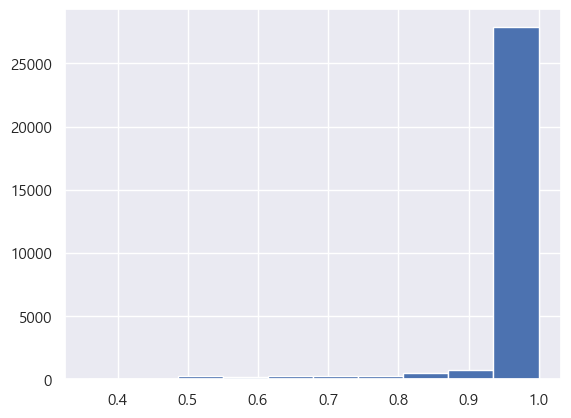

In [17]:
# 데이터결합: 원본+감성분석
df_rating = pd.read_csv(os.path.join('.', 'Data', 'df_prep_(1,2)_pred(bert-kor-base_3Label).csv'), index_col=0)
df_rating.Rating_Multi_Prob.hist()
df_rating.Rating_Multi_Prob.describe()

# Result Summary

In [ ]:
# word_freq_categ 기준으로 어떻게 sent2kwd가 정리가 되는거지?
# 감성분석에서 치매 관련 영화만 필터링 후 시연

,count,mean,std,min,25%,50%,75%,max
Viewing,"60,803.0000","2,018.3124",3.4260,"2,003.0000","2,015.0000","2,019.0000","2,021.0000","2,024.0000"


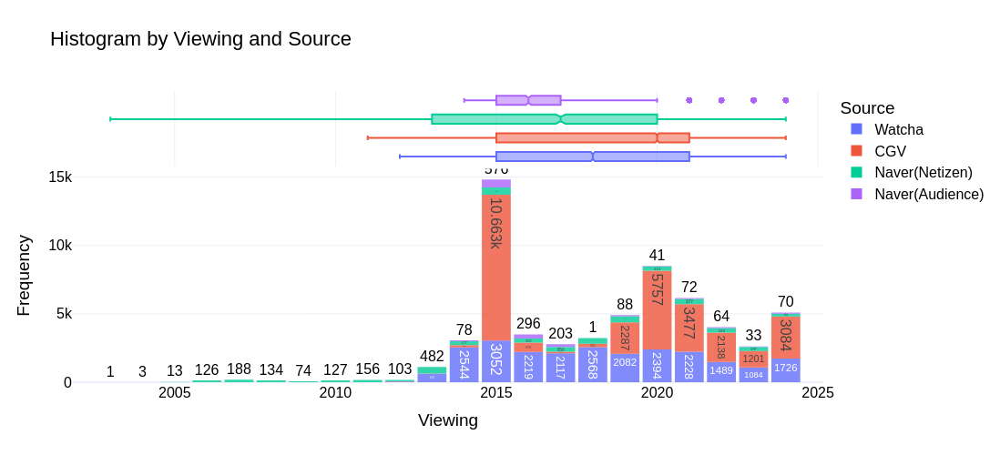

,count,mean,std,min,25%,50%,75%,max
Viewing,"60,803.0000","2,018.3124",3.4260,"2,003.0000","2,015.0000","2,019.0000","2,021.0000","2,024.0000"


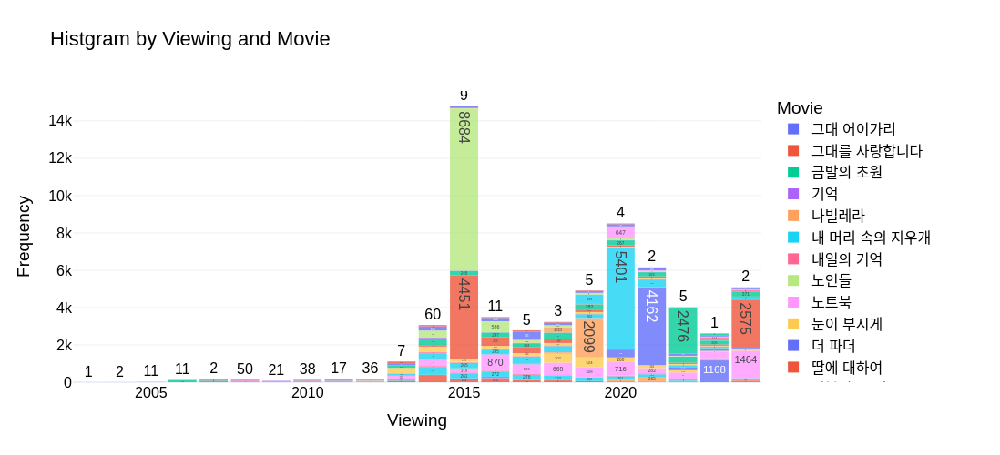

In [11]:
# 데이터 추세
## 연도별(리뷰) 소스별 리뷰의견수 추세
plot_histogram(df_freq, x='Viewing', color='Source', title='Histogram by Viewing and Source', marginal='box')
## 연도별(리뷰) 영화별 리뷰의견수 추세
plot_histogram(df_freq, x='Viewing', color='Movie', title='Histgram by Viewing and Movie')

,count,mean,std,min,25%,50%,75%,max
Length,"60,803.0000",9.3688,22.8256,1.0000,3.0000,5.0000,10.0000,"2,149.0000"


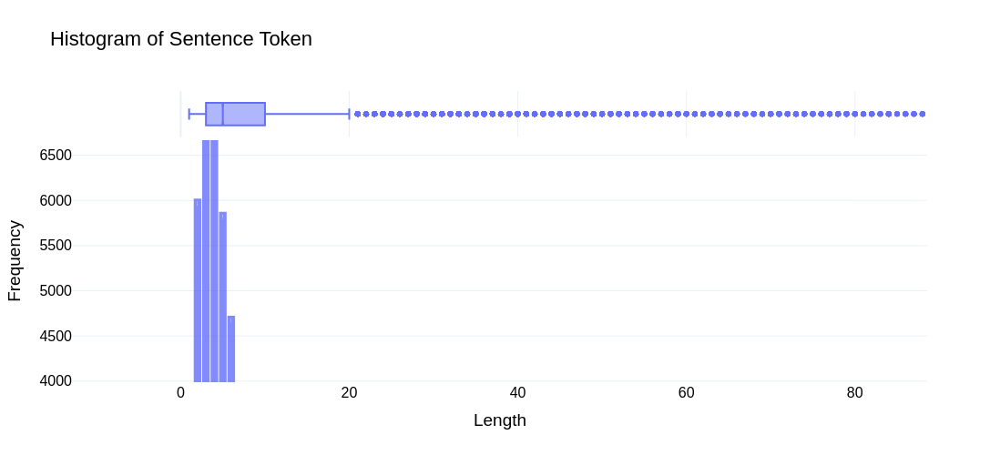

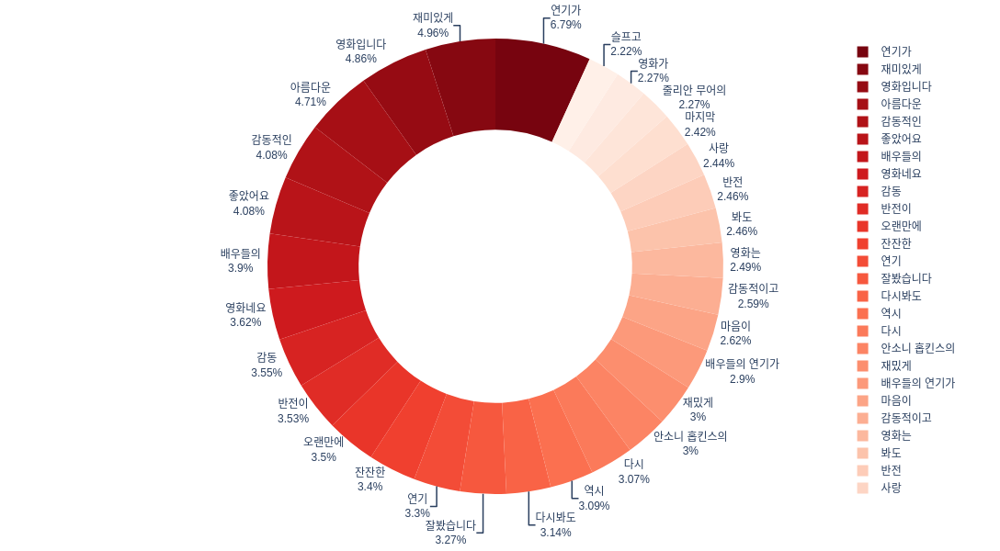

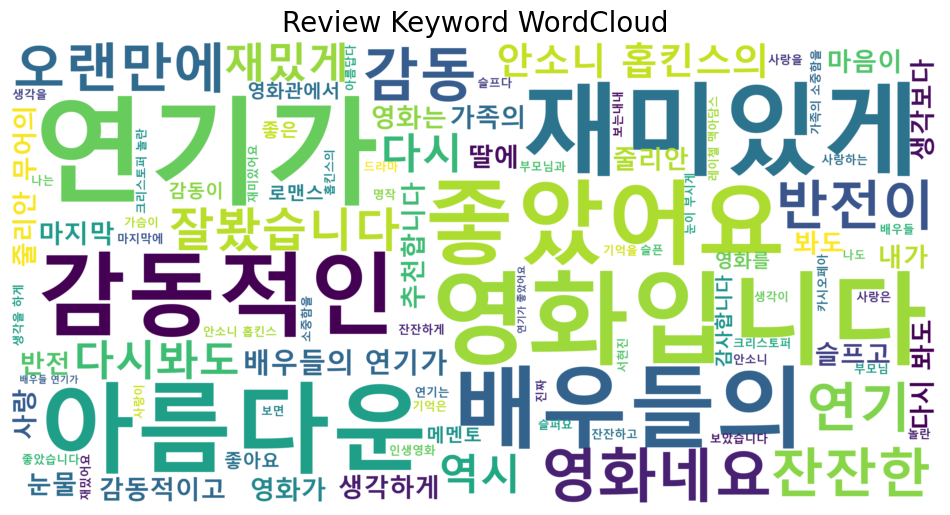

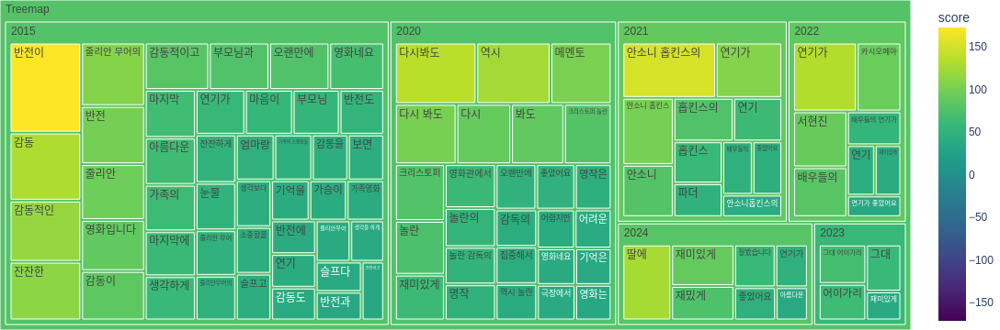

In [12]:
# 키워드 분포
## 리뷰문장 토큰 길이 분포
plot_histogram_senttoken(df_freq['Token_'+TOKENIZER]) 
## 전체기간 주요키워드 분포
plot_donut_wordfreq(word_freq)
plot_wordcloud(word_freq, title='Review Keyword WordCloud', max_font_size=50, save_local=False)
## 연도별(리뷰) 주요키워드 분포
plot_treemap_wordfreq(word_freq_categ)

Analysis...


100%|██████████████████████████████████████████████████████████████████████████| 2337/2337 [00:00<00:00, 584466.55it/s]

Number of Nodes: 2337
Number of Edges: 2745


,word,degree of centality,betweenness of centality,closeness of centality,eigenvector of centality,page rank,clustering coefficient
0,연기가,0.2667,0.0010,0.0019,0.0013,0.0004,0.0002
1,아름다운,0.2414,0.0010,0.0020,0.0045,0.0004,0.0005
2,반전이,0.1443,0.0005,0.0023,0.0099,0.0004,0.0007
3,감동,0.1276,0.0014,0.0029,0.0577,0.0004,0.0016
4,감동적인,0.0882,0.0009,0.0022,0.0538,0.0004,0.0033
5,좋았어요,0.0796,0.0004,0.0025,0.6803,0.0005,0.0027
6,배우들의,0.0771,0.0011,0.0022,0.0054,0.0004,0.0019
7,영화입니다,0.0629,0.0003,0.0018,0.0044,0.0004,0.0033
8,영화네요,0.0531,0.0002,0.0018,0.0044,0.0004,0.0031
9,재미있게,0.0497,0.0004,0.0020,0.0060,0.0004,0.0026


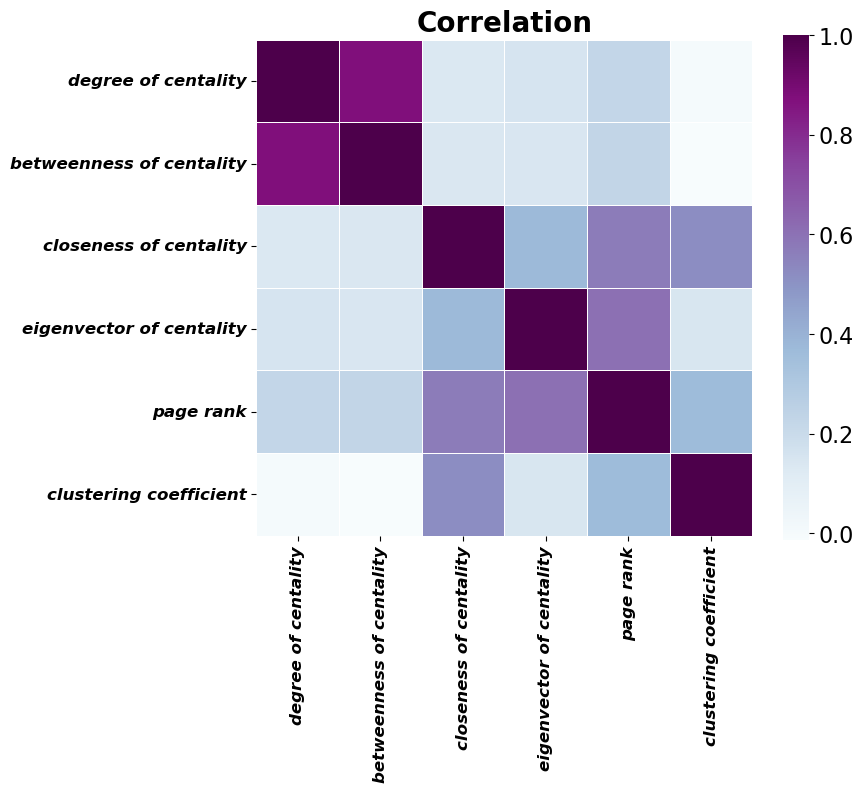

Saving...: 2025-02-20 04:14:32.104555


In [261]:
# 동시출현 단어네트워크
coword_sub = coword_direct_categ[coword_direct_categ.source.isin(word_freq.word.values[:10])].reset_index().iloc[:,1:]
G, node_stat = preprocessing_GraphNX(coword_sub, direct=True)

network_degree of centality.html


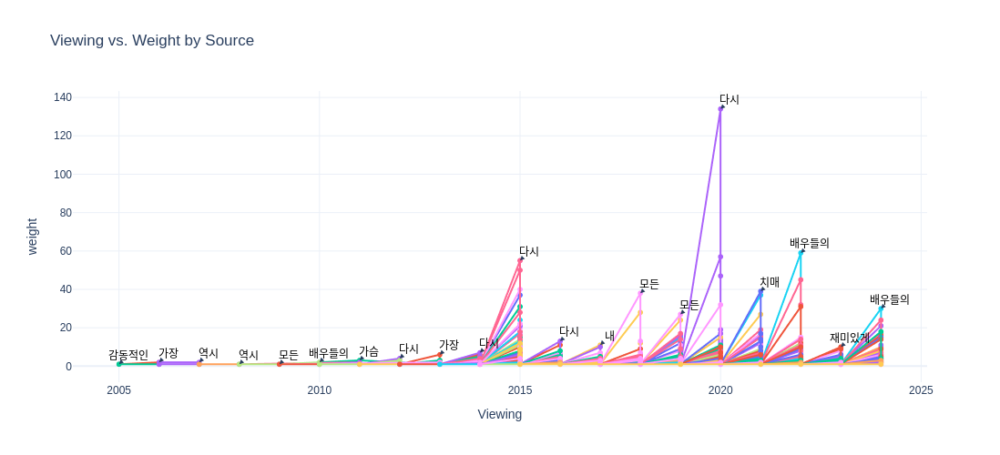

network_betweenness of centality.html


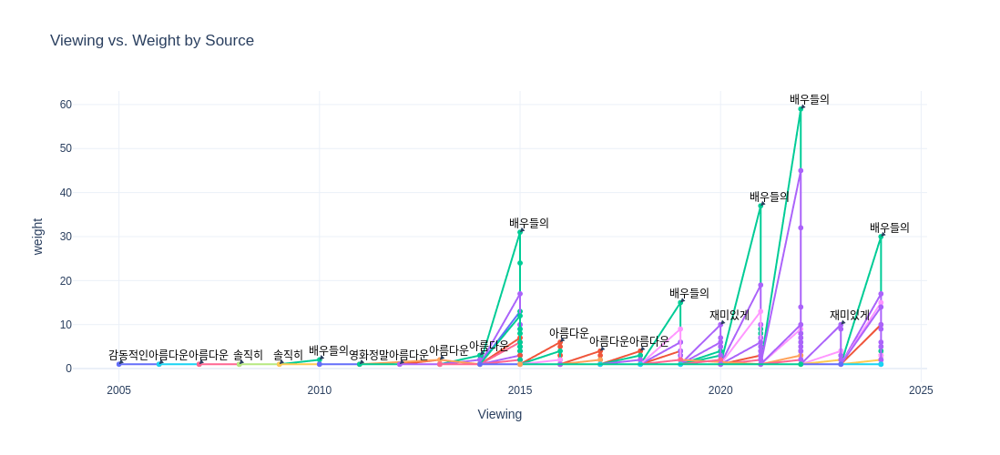

network_closeness of centality.html


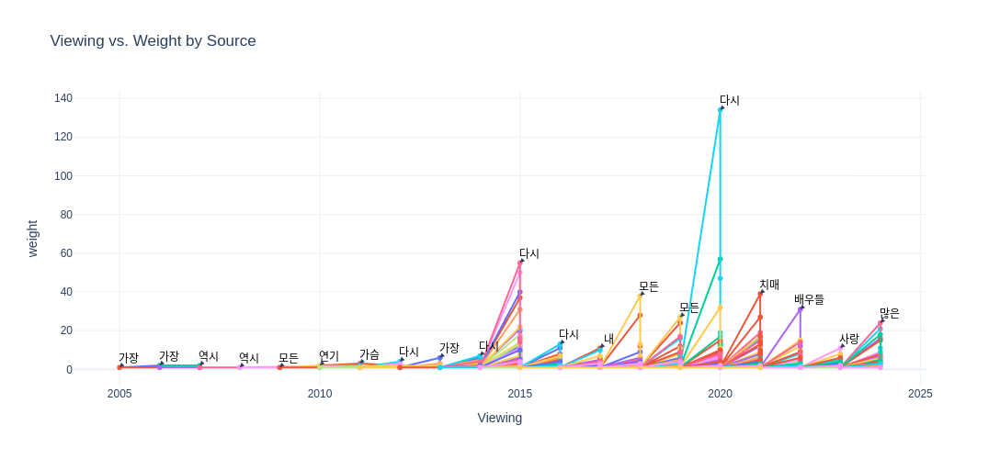

network_eigenvector of centality.html


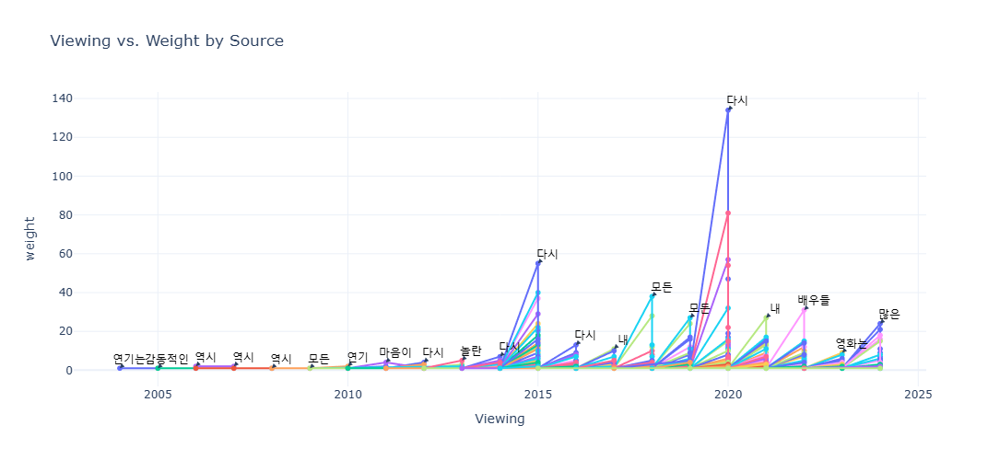

network_page rank.html


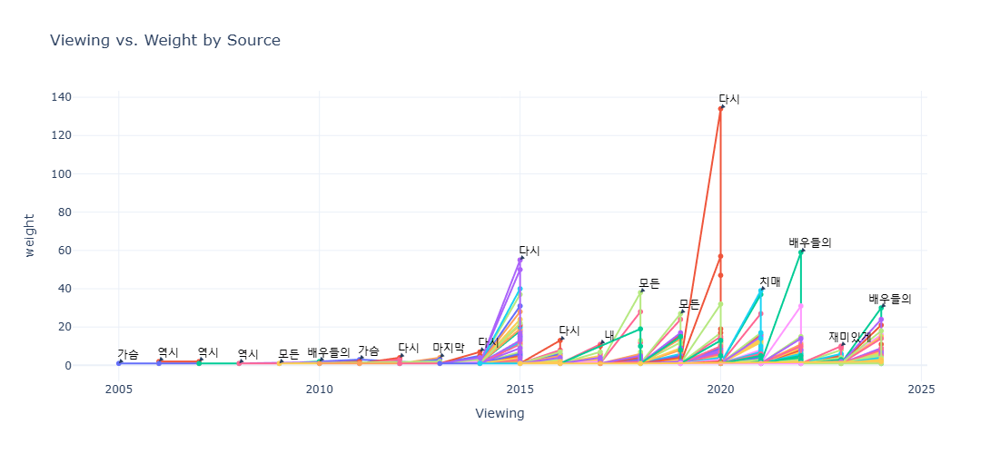

network_clustering coefficient.html


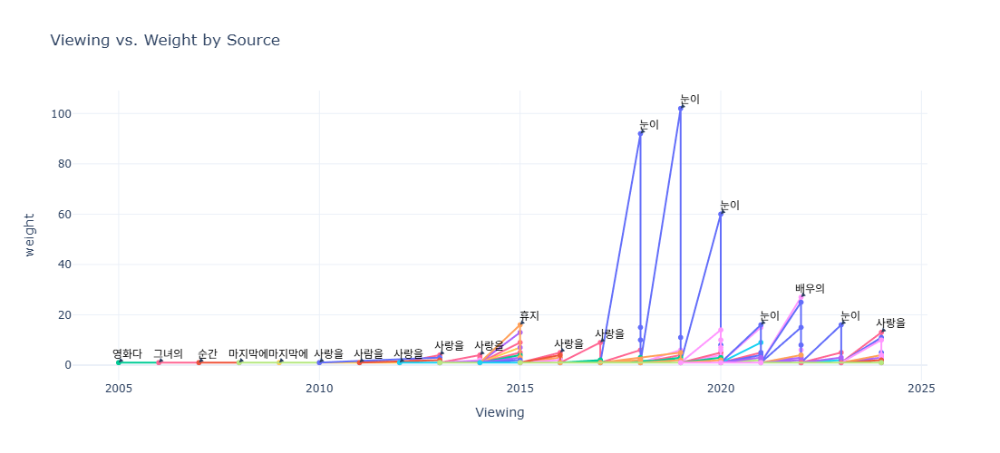

In [269]:
for col in node_stat.columns[1:]:
    ## 하위그룹
    top_nodes = node_stat.sort_values(by=col, ascending=False).word[:50]
    G_sub = G.subgraph(top_nodes)

    ## 동시출현 시각화
    net = Network(notebook=True)
    net.from_nx(G_sub)
    net.show_buttons(filter_=['physics'])
    net.toggle_physics(False)
    net.show('network_'+col+'.html')

    ## 단어중요도 변화 시각화
    df_plot = coword_direct_categ[coword_direct_categ.source.isin(top_nodes)].sort_values(by=['Viewing', 'weight'], ascending=[True, False])
    # fig = plt.figure(figsize=(11, 5))
    # ax = sns.lineplot(df_plot, x='Viewing', y='weight', hue='source', marker='o')
    
    # plt.title('Keyword Trend')
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    # plt.tight_layout()
    # plt.show()
    fig = px.line(df_plot, x='Viewing', y='weight', color='source', markers=True,
                  title="Viewing vs. Weight by Source")
    # 각 고유 Viewing 값마다 weight가 가장 큰 데이터 포인트 추출
    max_points = df_plot.loc[df_plot.groupby('Viewing')['weight'].idxmax()]
    # 각 최대 weight 데이터 포인트 marker 근처에 source 이름을 annotation으로 추가
    annotations = []
    for idx, row in max_points.iterrows():
        annotations.append(dict(
            x=row['Viewing'],
            y=row['weight'],
            xref="x",
            yref="y",
            text=row['source'],
            showarrow=True,
            arrowhead=2,
            ax=10,  # x 오프셋 (조정 가능)
            ay=-10, # y 오프셋 (조정 가능)
            font=dict(color="black", size=12)
        ))
    fig.update_layout(annotations=annotations, width=1000, height=500, showlegend=False)
    fig.show()

## LDA

- Latent Dirichlet Allocation (LDA)는 토픽모델링에 이용되는 대표적인 알고리즘

> - 토픽 모델링이 제공하는 토픽은 어떤 주제를 구성하는 단어들인지로 정의되며,
> - 문서 집합에서 이 단어 집합을 찾아 우리의 문서가 어떤 토픽인지 알 수 있음

- LDA 모델을 학습하기 전에 몇 개의 토픽으로 나눌 것인지 먼저 결정해야 함

> - 일반적으로 (1) perplexity와 coherence를 함께 고려하여 결정 + (2) 정성적인 토픽 갯수 고려하여 결정
>> - perplexity: 모델이 얼마나 잘 예측하는지 나타내는 지표로, 낮은 perplexity 값은 모델이 문서에서 나타나는 단어를 더 잘 예측한다는 것을 의미
>> - coherence: 발견된 토픽이 얼마나 의미있는지 나타내는 지표로, 높은 coherence 값은 토픽 내 단어들이 서로 관련성이 높다는 것을 의미

- LDAvis

> (1) Intertopic Distance Map (via multidimensional scaling)
> - 각 토픽이 가진 고차원의 단어들을 PCA로 2차원 축소 시각화
> - 원크기: 토픽의 단어들이 얼마나 포함 및 분포되어 있는지
> - 원거리: 토픽간의 유사성 (2개의 원이 겹친다면 유사한 토픽이라는 의미)
>
> (2) Top-30 Most Relevant Terms for Topic
> - 토픽 별로 가장 자주 등장하는 단어들(람디=1)과 토픽 간 차이가 많이나는 단어들(람다=0)을 종합적으로 고려 

2025-02-07 23:00:22,817	INFO worker.py:1619 -- Calling ray.init() again after it has already been called.


Optimal Topic Number:  2


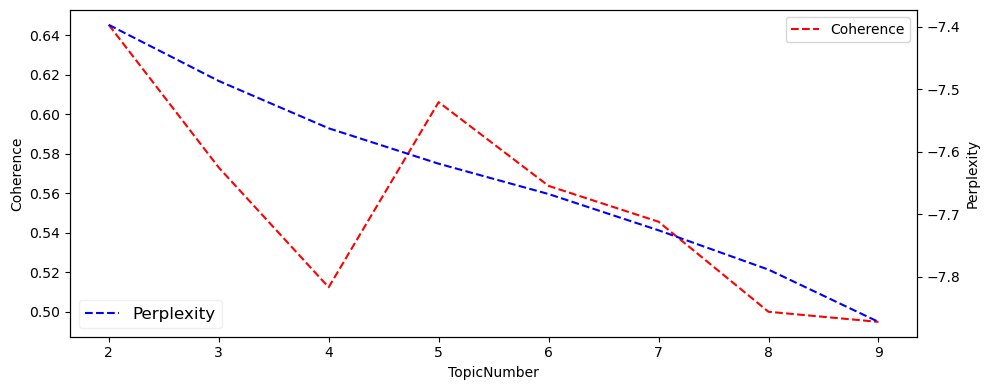

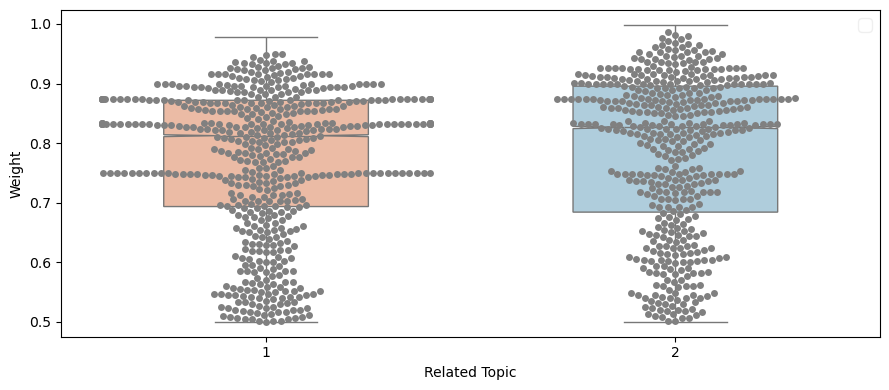

,Related Keywords,Number of Sentences,Percentage,Average Probability
Topic 1,"'연기(22.5%)', '감동(20.2%)', '눈물(11.0%)', '서현진(9.2%)', '연기가(8.7%)', '반전(8.1%)', '진짜(5.8%)', '좋은(5.2...",30987,0.5096,0.7731
Topic 2,"'사랑(28.6%)', '가족(11.1%)', '치매(9.5%)', '이야기(8.7%)', '지는(7.9%)', '기억(7.1%)', '가는(7.1%)', '마음(7.1%)...",29816,0.4904,0.7854


In [23]:
# 주요토픽 트랜드
## 원래의견 기준 LDA 최적화
save_name = SAVE_NAME_LDA.split('.')[0]+'_CommentPrepAuto(1,3)_Topic{}.xlsx'.format(NUM_TOPICS)

topic_kw_LDA, topic_doc_LDA, \
doc_topic_LDA, model_LDA = modeling_LDA(df_freq['Token_'+TOKENIZER], df_freq['Comment_Prep'],
                                        num_topics=NUM_TOPICS, num_topicwords=NUM_TOPICWORDS, num_topicsamples=NUM_TOPICSAMPLES,
                                        save_local=SAVE_LOCAL, save_name=save_name)
display(topic_kw_LDA)

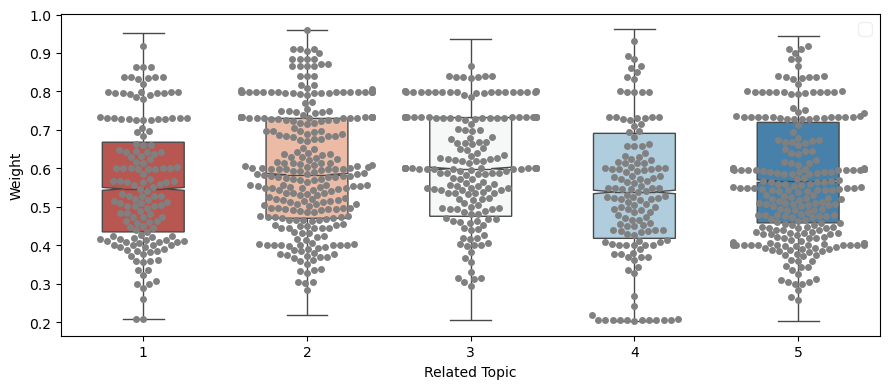

,Related Keywords,Number of Sentences,Percentage,Average Probability
Topic 1,"'엄마(25.8%)', '아버지(12.5%)', '반전이(10.8%)', '재밌게(8.3%)', '사랑(8.3%)', '눈물(7.5%)', '있어(7.5%)', '연기(6....",9315,0.1532,0.5459
Topic 2,"'사랑(26.1%)', '이야기(11.1%)', '가족(10.6%)', '치매(10.0%)', '기억(8.9%)', '가는(7.8%)', '지는(7.8%)', '알츠하이머(...",16420,0.2701,0.5576
Topic 3,"'감동(28.5%)', '연기(24.8%)', '연기가(11.3%)', '서현진(8.2%)', '배우들의(5.3%)', '좋았어요(5.0%)', '배우님(4.7%)', '스...",11927,0.1962,0.5967
Topic 4,"'사랑(19.5%)', '내가(12.0%)', '시를(10.5%)', '남자(9.8%)', '나를(9.0%)', '아름다운(9.0%)', '인생(8.3%)', '나는(7.5...",8572,0.1410,0.5798
Topic 5,"'반전(19.1%)', '눈물(15.4%)', '많이(9.3%)', '보면(8.6%)', '최고(8.6%)', '진짜(8.0%)', '펑펑(8.0%)', '좋은(8.0%)'...",14569,0.2396,0.5941


,Topic Number,Weight,Comment_Prep
919,Topic 1,0.9521,못만든 드라마도 이것보다는 잘만들었다 뻔하고도 예상대로 흘러가는 스토리에 실소만 나온다 거기다가 신파를 국악과 연결해서 감정을 울릴려고 같은데 전혀 아니올시다다
7583,Topic 1,0.9513,내가 본 로맨스물중에 최고다 로맨스물봐도 아무런 감정없는데 이건 진짜 맘이 잔잔해졌고 나도 사랑 하고싶단 오글거리는 생각이 들게해줬다 나중에 또봐야지
3277,Topic 1,0.9455,발레 라는 주제와 송강 이라는 배우에 보기 시작했는데 로맨스없는 드라마라 좋았다 송강을 로맨스 없이 쓰다니 패기있는 드라마였다 좋았다
45611,Topic 1,0.9367,가족애로 뻔한 감성을 끌어내는 영화들이 간혹 근데 나는 이걸 울었나했더니 결론은 박근형님 최고시다
4,Topic 1,0.9323,실제 비슷한 생활을 해본 조금은 어설프기도 공감하기 힘든 지루한 진행 자꾸 그걸 느끼라고 하는데 자꾸 느껴지는
21533,Topic 2,0.9597,이타심이 사람들만 세상에 존재하면 인간이란 평생을 이끌어갈 종이 될수도 있을텐데란 생각을 하게된다 사는 세상욕심 탐욕이것만 견제하고 남에게 피해만 안주면 되는것 아닌가하지만...
58204,Topic 2,0.9594,예측할 없었던 상황에서 혼자만의 생각으로 모든것을 거부하는 주인공과 주인공에게 당연한듯 예측할 없었던 따뜻함을 주는 가족들 가슴이 메어질정도로 안타깝고 슬픈 따뜻한 이야기
1219,Topic 2,0.9591,남녀의 사랑을 넘어서 사람과 사람의 사랑을 표현한 것같아서 따뜻하다 기억하고 싶은 명대사가 많았다 지금 생각나는 건 우리는 다시 부부가 되었다 가족이었는데
977,Topic 2,0.9574,모든 인간의 두려움이기도 치매라는 병 나의 마지막의 모습이게 될까봐 두려운 나약한 인간의 모습 인생의 허무함을 느껴보는 시간이 됨 억지 감정이입을 유도하는 듯한 교육용 시청...
35271,Topic 2,0.9551,삶의 존엄성을 위협하는 망각 자신을 기억하는 모든이들을 기억하지 못할 때의 비극적인 마음이 오롯히 전해졌다 명망있는 지성인으로 이룬 모든 성취와 업적들이 기억을 망각하는 유...


In [40]:
## 원래의견 기준 LDA 최종
NUM_TOPIC_FINAL = 5
save_name = SAVE_NAME_LDA.split('.')[0]+'_CommentPrepAuto(1,3)_Topic{}.xlsx'.format(NUM_TOPIC_FINAL)

topic_kw_LDA, topic_doc_LDA, \
doc_topic_LDA, model_LDA = modeling_LDA(df_freq['Token_'+TOKENIZER], df_freq['Comment_Prep'],
                                        num_topics=NUM_TOPIC_FINAL, num_topicwords=NUM_TOPICWORDS, num_topicsamples=NUM_TOPICSAMPLES,
                                        save_local=SAVE_LOCAL, save_name=save_name)
display(topic_kw_LDA, topic_doc_LDA)

In [ ]:
# ## 토픽별 워드클라우드
# word_freq_topic, wordadj_freq_topic, df_freq_topic = preprocessing_wordfreq(doc_topic_LDA, 
#                                                                             colname_target=TARGET+'_Prep', colname_category='Related Topic', 
#                                                                             ngram_range=NGRAM_RANGE,
#                                                                             tfidf_maxcol=TFIDF_MAXCOL, tfidf_dellowfreq=TFIDF_DELLOWFREQ,
#                                                                             keybert_topnkwd=KEYBERT_TOPNKWD,
#                                                                             sent2kwd_ray=RAY,
#                                                                             num_showkeyword=NUM_SHOWKEYWORD, 
#                                                                             save_local=SAVE_LOCAL, save_name=SAVE_NAME_PREP+'topic')

# for group in word_freq_topic[TOKENIZER]['category'].unique():
#     df_sub = word_freq_topic[word_freq_topic[TOKENIZER]['category'] == group]
#     plot_wordcloud(df_sub, title='Topic_'+str(group), max_font_size=50, save_local=False)

In [41]:
# 데이터결합: 원본+감성분석+토픽결과
df_freq_topic = pd.concat([df_freq, doc_topic_LDA.iloc[:,1:]], axis=1)

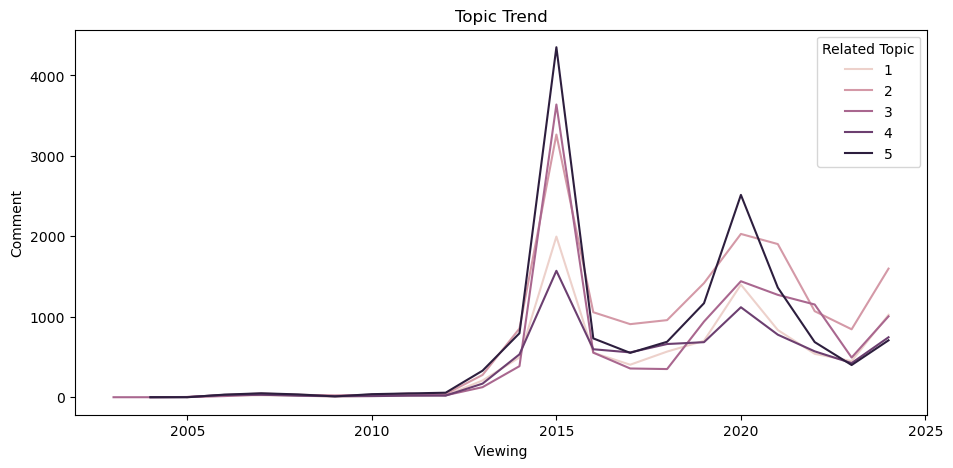

In [42]:
## 토픽 Hot & Cold 리뷰 트랜드
df_plot = df_freq_topic.groupby(['Viewing', 'Related Topic'])['Comment'].count().reset_index()
fig = plt.figure(figsize=(11, 5))
sns.lineplot(df_plot, x='Viewing', y='Comment', hue='Related Topic')
plt.title('Topic Trend')
plt.show()
# ## 토픽 Hot & Cold 확률분포 트랜드
# df_plot = df_freq_topic.groupby(['Viewing', 'Related Topic'])['Weight'].mean().reset_index()
# fig = plt.figure(figsize=(11, 5))
# sns.lineplot(df_plot, x='Viewing', y='Weight', hue='Related Topic')
# plt.title('Topic Trend')
# plt.show()

In [56]:
## 영화별 토픽 분포
df_topic_ratio, _ = LDA_resultstat(df_freq_topic, 'Movie', 'Related Topic', colname_prefix='Topic')
movie_topic2 = list(df_topic_ratio[np.argmax(df_topic_ratio, axis=1) == 1].index)

,Topic1,Topic2,Topic3,Topic4,Topic5
Movie,,,,,
그대 어이가리,0.163145,0.245985,0.304311,0.111581,0.174979
그대를 사랑합니다,0.165771,0.253262,0.220261,0.107444,0.253262
금발의 초원,0.140351,0.289474,0.114035,0.198830,0.257310
기억,0.233871,0.306452,0.225806,0.056452,0.177419
나빌레라,0.248731,0.253807,0.091371,0.233503,0.172589
내 머리 속의 지우개,0.167945,0.213981,0.126598,0.215686,0.275789
내일의 기억,0.115315,0.333333,0.145946,0.163964,0.241441
노인들,0.172414,0.448276,0.068966,0.275862,0.034483
노트북,0.168010,0.342064,0.139492,0.213422,0.137012


,Topic Rank
Movie,
그대 어이가리,3 > 2 > 5 > 1 > 4
그대를 사랑합니다,2 > 5 > 3 > 1 > 4
금발의 초원,2 > 5 > 4 > 1 > 3
기억,2 > 1 > 3 > 5 > 4
나빌레라,2 > 1 > 4 > 5 > 3
내 머리 속의 지우개,5 > 4 > 2 > 1 > 3
내일의 기억,2 > 5 > 4 > 3 > 1
노인들,2 > 4 > 1 > 3 > 5
노트북,2 > 4 > 1 > 3 > 5


In [45]:
# 주요토픽별 감성(Rating) 트랜드
## 영화별 감성 분포
df_rating_binary_ratio, _ = LDA_resultstat(df_freq_topic, 'Movie', 'Rating_Binary', colname_prefix='Rating')

,Rating-1,Rating0,Rating1
Movie,,,
그대 어이가리,0.111581,0.391378,0.497041
그대를 사랑합니다,0.188795,0.476592,0.334612
금발의 초원,0.081871,0.418129,0.500000
기억,0.145161,0.846774,0.008065
나빌레라,0.114213,0.885787,0.000000
내 머리 속의 지우개,0.270673,0.592072,0.137255
내일의 기억,0.117117,0.482883,0.400000
노인들,0.068966,0.896552,0.034483
노트북,0.197923,0.664135,0.137942


,Rating Rank
Movie,
그대 어이가리,1 > 0 > -1
그대를 사랑합니다,0 > 1 > -1
금발의 초원,1 > 0 > -1
기억,0 > -1 > 1
나빌레라,0 > -1
내 머리 속의 지우개,0 > -1 > 1
내일의 기억,0 > 1 > -1
노인들,0 > -1 > 1
노트북,0 > -1 > 1


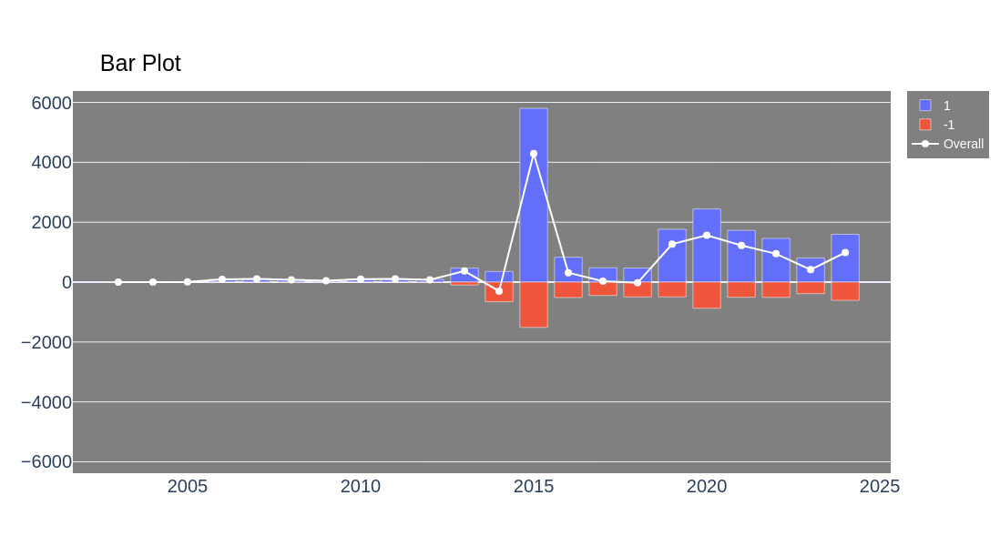

In [61]:
## 연도별 감성 긍부정 트랜드
df_sent_time = df_freq_topic.groupby('Viewing')[['Rating_Binary']].value_counts().unstack().loc[:,[-1,1]]
df_sent_time = df_sent_time[[1,-1]]
df_sent_time.iloc[:,1] = df_sent_time.iloc[:,1] * -1
plot_bar(df_sent_time, summation=True, save_local=False)

1


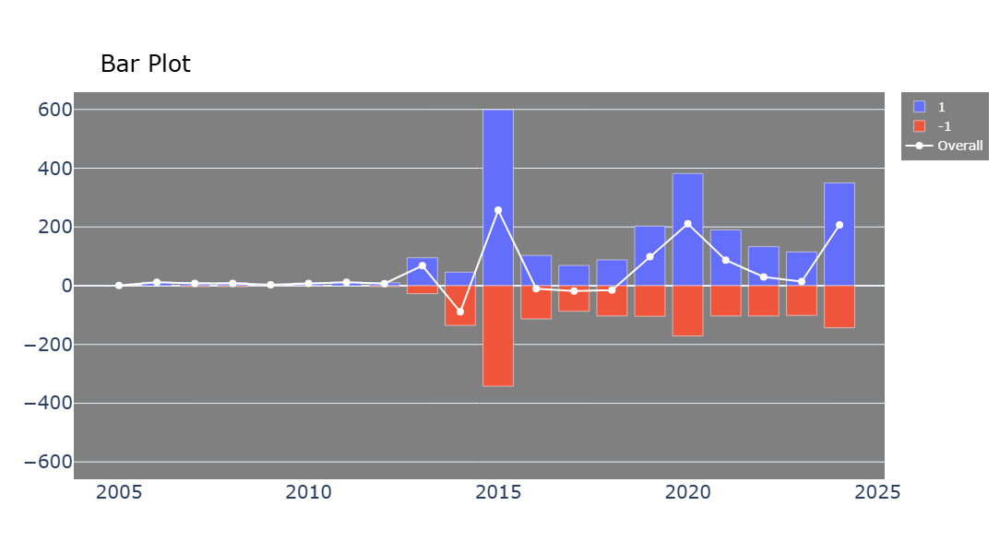

2


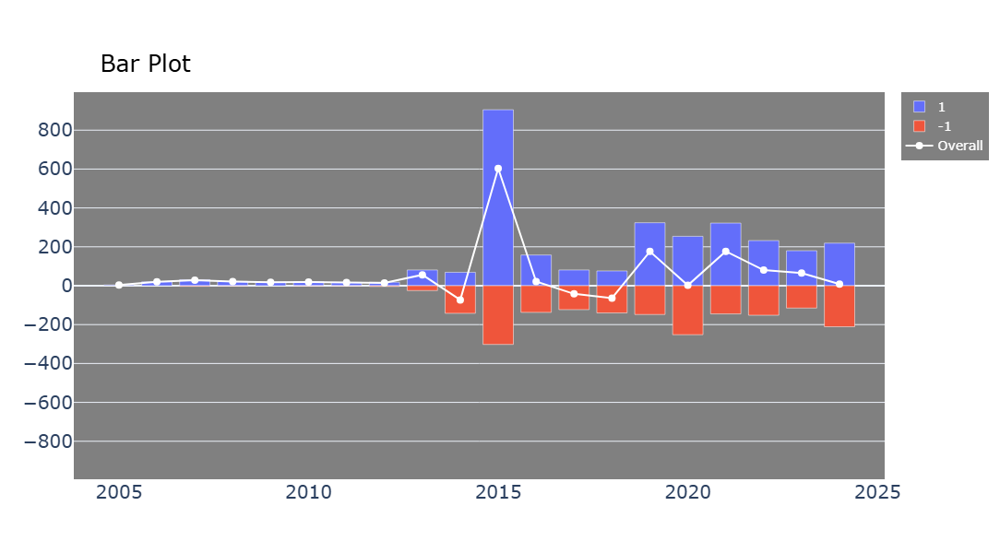

3


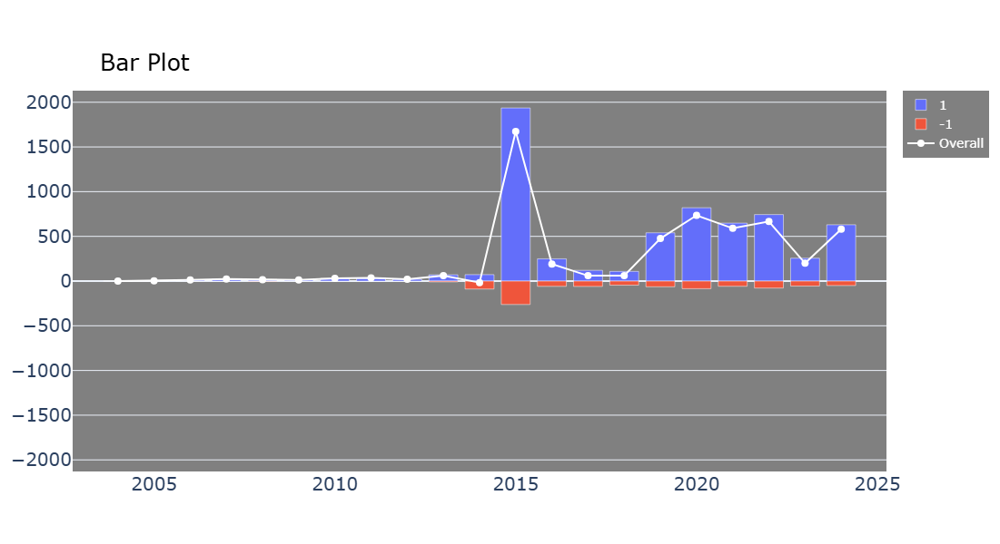

4


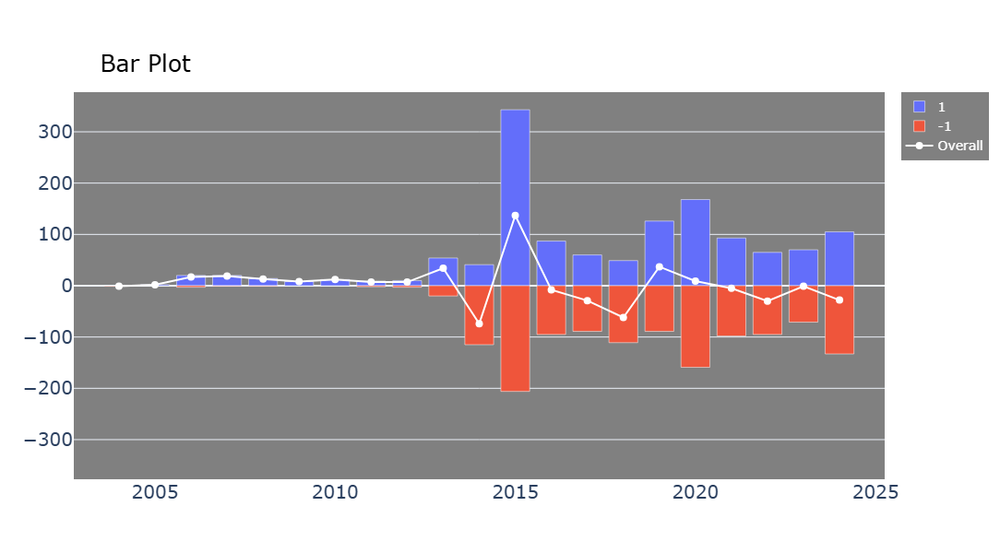

5


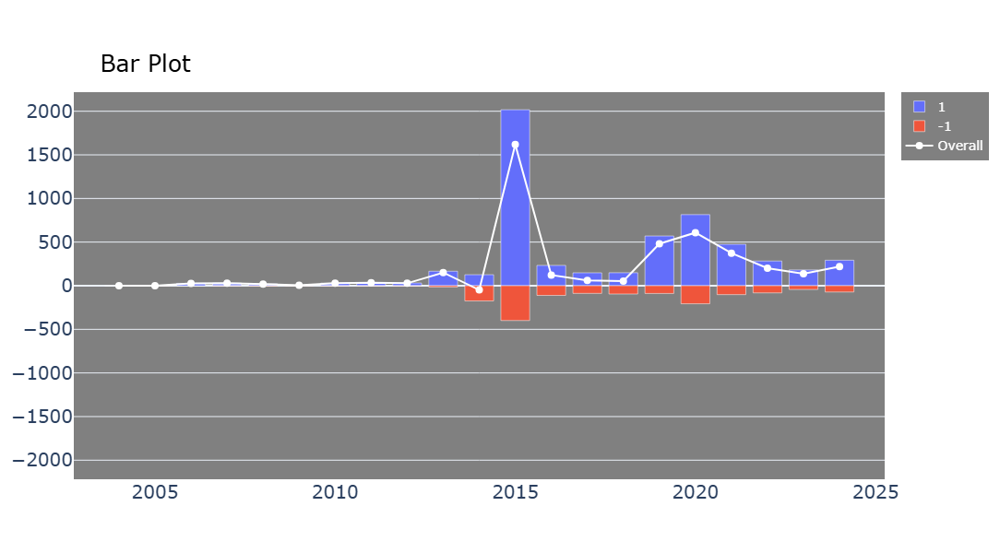

In [70]:
## 토픽별 감성 긍부정 트랜드
for topic in sorted(df_freq_topic['Related Topic'].unique()):
    print(topic)
    df_sub = df_freq_topic[df_freq_topic['Related Topic'] == topic].reset_index().iloc[:,1:]
    df_sub_time = df_sub[df_sub.Rating_Binary != 0].groupby('Viewing')[['Rating_Binary']].value_counts().unstack()
    df_sub_time = df_sub_time[[1,-1]]
    df_sub_time.iloc[:,1] = df_sub_time.iloc[:,1] * -1
    plot_bar(df_sub_time, summation=True, save_local=False)

# Others

In [80]:
## 치매관련 영화기준 치매주제의 평점 긍부정 트랜드
movie_filter_num = 3
for topic in sorted(df_freq_topic['Related Topic'].unique()):
    if topic == 2:
        df_sub = df_freq_topic[df_freq_topic.Movie.isin(movie_topic2)].reset_index().iloc[:,1:]    # 치매영화 필터
        df_sub = df_sub[df_sub['Related Topic'] == topic].reset_index().iloc[:,1:]    # 치매주제 필터
        # df_sub = df_freq_topic[df_freq_topic['Related Topic'] == topic].reset_index().iloc[:,1:]
        df_group = df_sub[df_sub.Rating_Binary != 0].groupby(['Movie'])[['Rating_Binary']].sum()
        movie_posi = list(df_group[df_group>=0].dropna().index)
        movie_nega = list(df_group[df_group<0].dropna().index)
        display(df_group.loc[movie_posi,:].sort_values(by='Rating_Binary', ascending=False).T)
        display(df_group.loc[movie_nega,:].sort_values(by='Rating_Binary', ascending=False).T)
        movie_posi = list(df_group.loc[movie_posi,:].sort_values(by='Rating_Binary', ascending=False).index[:movie_filter_num])
        movie_nega = list(df_group.loc[movie_nega,:].sort_values(by='Rating_Binary', ascending=False).index[-movie_filter_num:])
        print(movie_posi, movie_nega)

Movie,스틸 앨리스,더 파더,딸에 대하여,금발의 초원,왓 데이 해드,사랑의 기적,"조금씩, 천천히 안녕",내일의 기억,시,어웨이 프롬 허,해피엔딩 프로젝트,소중한 사람,그대를 사랑합니다
Rating_Binary,243,230,61,40,37,26,26,25,18,15,14,7,4


Movie,노인들,천일의 약속,기억,세비지스,레저 시커,살인자의 기억_복수,이터널 메모리,나빌레라,눈이 부시게,첫 키스만 50번째,노트북
Rating_Binary,-1,-2,-3,-4,-6,-8,-8,-10,-24,-38,-255


['스틸 앨리스', '더 파더', '딸에 대하여'] ['눈이 부시게', '첫 키스만 50번째', '노트북']


In [81]:
## 감성에 따른 데이터분리
df_freq_topic_posi = df_freq_topic[df_freq_topic.Movie.isin(movie_posi)]
df_freq_topic_posi = df_freq_topic_posi[df_freq_topic_posi.Rating_Binary == 1].reset_index().iloc[:,1:]
df_freq_topic_nega = df_freq_topic[df_freq_topic.Movie.isin(movie_nega)]
df_freq_topic_nega = df_freq_topic_nega[df_freq_topic_nega.Rating_Binary == -1].reset_index().iloc[:,1:]

[Kss]: too few updates, training might not converge; consider increasing the number of passes or iterations to improve accuracy


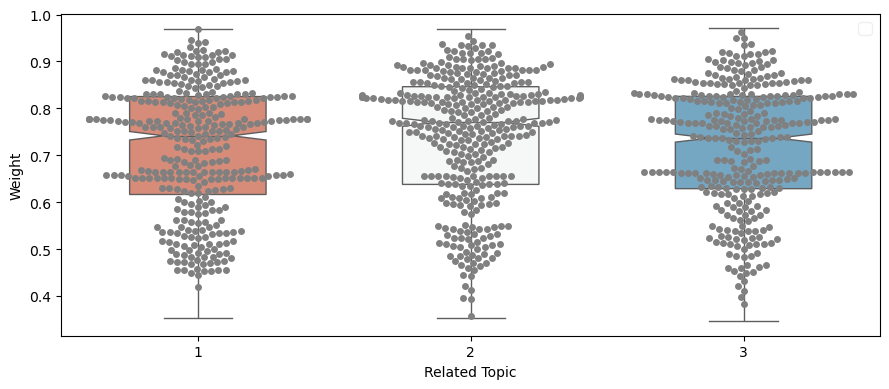

,Related Keywords,Number of Sentences,Percentage,Average Probability
Topic 1,"'연기(22.4%)', '감동(18.0%)', '무어(9.8%)', '앨리스(9.3%)', '아름다운(7.7%)', '영화다(7.7%)', '사랑(7.7%)', '다시(6....",1302,0.3204,0.7384
Topic 2,"'연기(15.3%)', '연기가(11.8%)', '대해(11.8%)', '생각(9.7%)', '좋았다(9.7%)', '인생(8.3%)', '내용(8.3%)', '무어(8.3...",1474,0.3627,0.7143
Topic 3,"'알츠하이머(15.9%)', '영화입니다(13.8%)', '사랑(10.1%)', '가족(9.4%)', '연기(9.4%)', '앨리스(9.4%)', '모습을(8.7%)', '...",1288,0.3169,0.7160


,Topic Number,Weight,Comment
4006,Topic 1,0.9685,역시 줄리언무어의 연기와 매력에 집중하게 했다. 알츠하이머와는 별개로 삶 전반적으로 공감가는 부분이 많았다. 크리스틴 스튜어트의 매력 또한 봐도봐도 새롭다. 잔잔하게 일상...
1309,Topic 1,0.9671,"그 누구도 믿지 못하게 되는 공포, 시공간이 뒤틀리는 경험의 공포, 자신의 기억과 보여지는 현상 사이의 괴리에서 느껴지는 공포, 결국 더이상 무슨 일이 벌어지고 있는지 모르..."
1319,Topic 1,0.9651,우연히 채널을 돌리다가 본 작품.. 루즈함보다는? 현실의 무서움? ㅜㅜ 반전은 관객이 다 알고있는 그대로 흐른다.. 조연들의 연기가 압권이었다.. 한정된 공간.. 한정된 사...
1750,Topic 1,0.9651,잔잔해서 지루하려나 했는데 어느순간 나도 모르게 영화속에 들어가 있는 느낌.. 배우들의 연기도 감독의 연출도 너무 좋았던 영화 특히 화장실에서 모녀가 나누는 대화에서는 나도...
4061,Topic 1,0.9626,한 인간 존재의 상실의 과정을 섬세하게 다룬 영화다. 기억과 지성의 상실은 정체성의 상실로 이어지는 것인가? 성숙한 사랑의 자세는 무엇인가? 여러가지 질문을 안겨주는 영화다.
2467,Topic 2,0.9689,인간애 대해서 깊이 있게 생각할 수 있는 영화를 만난것 같아 좋았다.여러가지 생각을 영화를 보는내내 하게 되었고 끝나고 난 뒤에도 많은 생각을 할 수 있게 되었다.얼마전 ...
2283,Topic 2,0.9662,오민애 배우의 잔잔한 연기가 마음 속에 오래 남아요. 요양보호사로서 최선을 다하는 모습에 뭉클했어요. '나이가 들어서 쓸모 없어지면 사회적으로 버림받느거냐'며 따지듯 묻는 ...
1817,Topic 2,0.9639,국민엄마로 등극하고 계시는 오민애 배우님의 연기 너무 좋네요! 최근에 본 세 편의 영화에서 각기 다른 캐릭터의 엄마를 연기하셨는데 모두 다 빙의모드이신게 신기해요. 봄날의 ...
1203,Topic 2,0.9620,"와 역시 기대했던 대로였어요! 대배우 안소니 홉킨스님 연기 그 자체만으로도 흡입력 쩌는 영화ㅜㅠㅠㅠㅜ 소리치실때도 박력이 아주,,, 엄지척, 결말도 여운이 남고 연출도 살짝..."
337,Topic 2,0.9619,정말 좋았어요. 이 영화는 안소니 홉킨스 할아버지를 위해 다시 각색을 한 영화라고 합니다. 연로하신 부모님을 생각하게 합니다. 정말 현실적이어서 가슴에 와 닿아 눈물이 났습...


[Kss]: too few updates, training might not converge; consider increasing the number of passes or iterations to improve accuracy


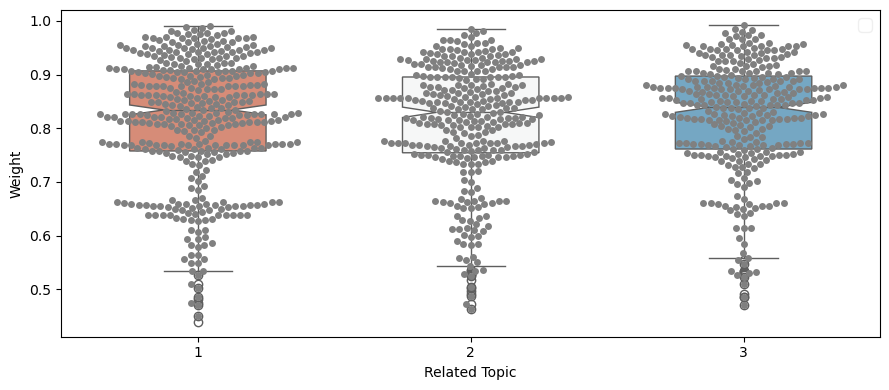

,Related Keywords,Number of Sentences,Percentage,Average Probability
Topic 1,"'사랑(55.9%)', '노아(7.0%)', '노트북(5.6%)', '다시(4.9%)', '나는(4.9%)', '로맨스(4.9%)', '레이첼(4.2%)', '이야기(4.2...",655,0.3867,0.8159
Topic 2,"'사랑(16.7%)', '로맨스(12.5%)', '이야기(12.5%)', '없는(9.4%)', '남주(9.4%)', '맥아담스(9.4%)', '내가(8.3%)', '불륜(7...",521,0.3076,0.8102
Topic 3,"'사랑(39.8%)', '노아(8.5%)', '앨리(8.5%)', '로맨스(7.6%)', '스토리(7.6%)', '이야기(6.8%)', '없는(5.9%)', '남자(5.1%...",518,0.3058,0.8196


,Topic Number,Weight,Comment
442,Topic 1,0.9896,내가 하면 로맨스 . 앨리의 시점에서 영화를 본다면 충분히 가슴 아린 사랑 이야기다 첫사랑과 생이별도 모자라 다른사람과 약혼까지 한 뒤 첫사랑을 다시 만나게 되다니 이건 ...
820,Topic 1,0.9885,라이언 고슬링 인기 많은 거 이해 못했는데 처음으로 이해함 엘리 너무 사랑스럽고 노아랑 너무 귀엽게 사겼는데 부모님이 반대한 건 인정 그 때 바로 이어졌으면 솔직히 현실적 ...
680,Topic 1,0.9875,“한 사람을 지극히 사랑했으니 내 인생은 성공한 인생입니다” 로맨스 영화중 레전드가 아닐까.. 사실 부모님이 사랑하신 모습과 비슷한 스토리라 마음에 오래 남음. 고집세고 ...
974,Topic 1,0.9852,솔직히 왜 유명한지 모르겠다 보면서 나만 론 입장 생각한건가 분명 주인공들 입장에서야 첫사랑이고 늙을 때까지 변함 없는 사랑이겠지만 론 입장에서는 결혼식 앞두고 예비신부가 ...
6,Topic 1,0.9850,"""운명적 사랑을 대신할 조건은 우리가 크고 작은 사랑을 하고 있다는 전제가 아닌 지금 마주보고 있는 그 사람에 대한 흔들림 없는 태도"" 떨어져 있어도 서로만을 생..."
738,Topic 2,0.9846,* 의도치 않게 오늘 라이언 고슬링 나오는 영화만 보네.. 1. 에 이게 가능하다고??? 했는데 예??? 실화기반 소설이 원작이라구요??? 예…??? 진짜 드라마보다 더 ...
1313,Topic 2,0.9814,"내 삶은, 때로는 불행했고 때로는 행복했습니다. 삶이 한낱 꿈에 불과하다지만 그럼에도 살아서 좋았습니다. 새벽의 쨍한 차가운 공기, 꽃이 피기 전 부는 달큰한 바람, 해질 ..."
1014,Topic 2,0.9802,철 없이 이쁘고 부유한 소녀가 가진거 없이 열정과 순수한 사랑만 있는 남자를 만나는 내용인거면 남주인공을 조금 더 멋있게 풀어줬으면 서브남주를 선택하지 않고 주인공을 선택한...
878,Topic 2,0.9772,남성향 판타지 덕지덕지 묻은 로맨스 . 여주는 도시에서 온 부잣집 딸이지만 보잘것 없는 남주를 무조건 사랑해줘야 함 . 잘생기고 부자인 서브남주랑 약혼할 때마저도 여주는 남...
1087,Topic 2,0.9745,"이게 그렇게 인생 영화라는 사람이 많던데 뭔가 모르게 보고 싶지 않아서 이제야 보게 되었다. 레이첼 맥아담스가 정말 예쁘게 나온다는 것만으로도 볼 가치가 충분했고 , 이야..."


In [82]:
## 긍정영화 LDA 주제어
NUM_TOPIC = 3
save_name = SAVE_NAME_LDA.split('.')[0]+'_CommentPrepAuto(1,3)_SentiPosi_Topic{}.xlsx'.format(NUM_TOPIC)

topic_kw_LDA, topic_doc_LDA, \
doc_topic_LDA, model_LDA = modeling_LDA(df_freq_topic_posi['Token_'+TOKENIZER], df_freq_topic_posi['Comment'],
                                        num_topics=NUM_TOPIC, num_topicwords=NUM_TOPICWORDS, num_topicsamples=NUM_TOPICSAMPLES,
                                        save_local=SAVE_LOCAL, save_name=save_name)
display(topic_kw_LDA, topic_doc_LDA)

## 부정영화 LDA 주제어
NUM_TOPIC = 3
save_name = SAVE_NAME_LDA.split('.')[0]+'_CommentPrepAuto(1,3)_SentiNega_Topic{}.xlsx'.format(NUM_TOPIC)

topic_kw_LDA, topic_doc_LDA, \
doc_topic_LDA, model_LDA = modeling_LDA(df_freq_topic_nega['Token_'+TOKENIZER], df_freq_topic_nega['Comment'],
                                        num_topics=NUM_TOPIC, num_topicwords=NUM_TOPICWORDS, num_topicsamples=NUM_TOPICSAMPLES,
                                        save_local=SAVE_LOCAL, save_name=save_name)
display(topic_kw_LDA, topic_doc_LDA)

## BERTopic

In [11]:
# # 원래의견 기준 BERTopic
# save_name = SAVE_NAME_BERTopic.split('.')[0]+'_CommentAuto(1,2).xlsx'
# NUM_TOPICS_BERT = topic_kw_LDA.shape[0]

# topic_kw_BERT, topic_doc_BERT, \
# doc_topic_BERT, model_BERT = modeling_BERTopic(df_freq['Comment'], vectorizer_type='tfidf', 
#                                                ngram_range=NGRAM_RANGE,
#                                                tfidf_maxcol=TFIDF_MAXCOL, 
#                                                # umap_metric=UMAP_METRIC, umap_randomseed=UMAP_SEED,
#                                                num_topics=NUM_TOPICS_BERT, num_topicwords=NUM_TOPICWORDS, num_topicsamples=NUM_TOPICSAMPLES,
#                                                save_local=SAVE_LOCAL, save_name=save_name)
# display(topic_kw_BERT, topic_doc_BERT, doc_topic_BERT)

In [12]:
# # 토픽 유사성 구조 시각화
# model_BERT.visualize_topics()

In [13]:
# # Topic 별 Hierarchy를 출력하여 대략적 Topic의 갯수를 가늠하기 용이함
# model_BERT.visualize_hierarchy(top_n_topics=50)

In [14]:
# # Topic을 대표하는 상위 단어 5개씩 출력
# model_BERT.visualize_barchart(top_n_topics=50)

In [15]:
# # Topic간 유사도를 Cosine Similarity로 계산후 Heatmap으로 표현
# model_BERT.visualize_heatmap()

In [16]:
# # 일자별로 어떤 토픽이 증가하고 줄어들었는지 트랜드 파악
# topics_over_time = model_BERT.topics_over_time(docs=df['Comment'], timestamps=df.Date.to_list(), 
#                                                global_tuning=True, evolution_tuning=True)
# model_BERT.visualize_topics_over_time(topics_over_time, top_n_topics=50)

In [17]:
# # Topic내 대표하는 단어들에 대해서 c-tf-idf로 계산해서 각 단어가 Topic에서 차지하는 중요도를 계산했던 것을 Rank 순서대로 출력
# model_BERT.visualize_term_rank()